GAN을 학습하는 과정은 보기보다 까다롭습니다. 모델 구조, learning_rate, 파라미터 초기화, 생성자와 판별자의 경쟁 관계, 데이터의 특성 등 고려해야 할 것이 참 많습니다.

이번에는 앞에서 배운 FASHION-MNIST 데이터 생성용 DCGAN 모델구조를 이용해서 CIFAR-10 데이터를 생성하는 모델을 직접 만들어 봅시다.
모델 구현 및 학습의 전과정의 흐름은 거의 비슷하겠지만, 아래와 같이 몇 가지 달라지는 점이 있습니다.

- 이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경됩니다. 생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있습니다.
- 이미지가 단색의 grayscale에서 RGB 3채널의 컬러이미지로 변경됩니다. 시각화 과정에서 고려할 점이 있습니다.
- 입력데이터 전체 차원이 3~4배 증가하면서, 학습이 진행되는 양상이 다소 달라집니다.  

우선 주요 라이브러리 버전을 확인하고 진행합시다.


# STEP 1. 작업환경 구성하기
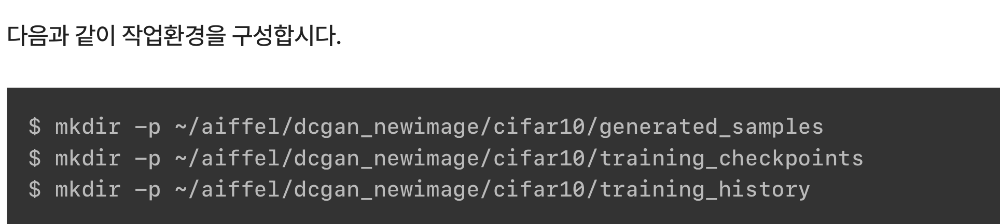

In [1]:
import imageio

import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

# STEP 2. 데이터셋 구성하기

CIFAR-10 데이터셋도 tf.keras 안에 있는 datasets에 포함되어 있어서, 아래와 같이 손쉽게 데이터셋을 구성할 수 있습니다.

## 데이터셋 불러오기

In [2]:
def load_data(label=None):
    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
    
    if label:
        # Train dataset
        df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label']) 
        df = df[df['label']==label]
        train_x = np.array([i for i in list(df['image'])])
        
        # Test dataset
        df = pd.DataFrame(list(zip(test_x, test_y)), columns =['image', 'label']) 
        df = df[df['label']==label]
        test_x = np.array([i for i in list(df['image'])])
        
    return train_x, test_x

In [3]:
train_x, test_x = load_data(label=8)
train_x.shape

170508288/170498071 [==============================] - 3s 0us/step


(5000, 32, 32, 3)

In [4]:
print("\nmax pixel:", train_x.max())
print("min pixel:", train_x.min())


max pixel: 255
min pixel: 0


- 학습에 사용할 train_x의 이미지를 -1, 1로 정규화합니다.
- 로드한 학습 데이터를 시각화를 통해 확인해 봅시다.
- tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성해 봅시다.

학습 시간이 너무 오래 걸린다면 한 종류의 데이터만 추출해 진행해도 좋습니다. 아래 코드는 참고만 하세요.

## 정규화

CIFAR-100 데이터 각 픽셀을 -1, 1로 정규화시켜서 사용할 예정이므로, 중간값을 0으로 맞춰주기 위해 127.5를 뺀 후 127.5로 나눔

In [5]:
train_x = (train_x - 127.5) / 127.5    # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


## 데이터 확인
정규화된 데이터를 (0~255) 의 RBG 값을 가진 데이터로 변환하여 시각화하기 위해 de_nomalize() 함수를 구현

In [6]:
def de_normalize(train):
    return (127.5 * train) + 127.5

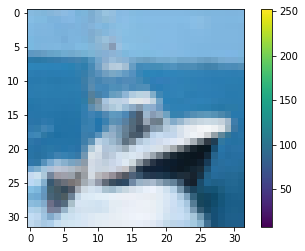

In [7]:
plt.imshow(de_normalize(train_x[0]).astype(np.int32).reshape(32, 32, 3))
plt.colorbar()
plt.show()

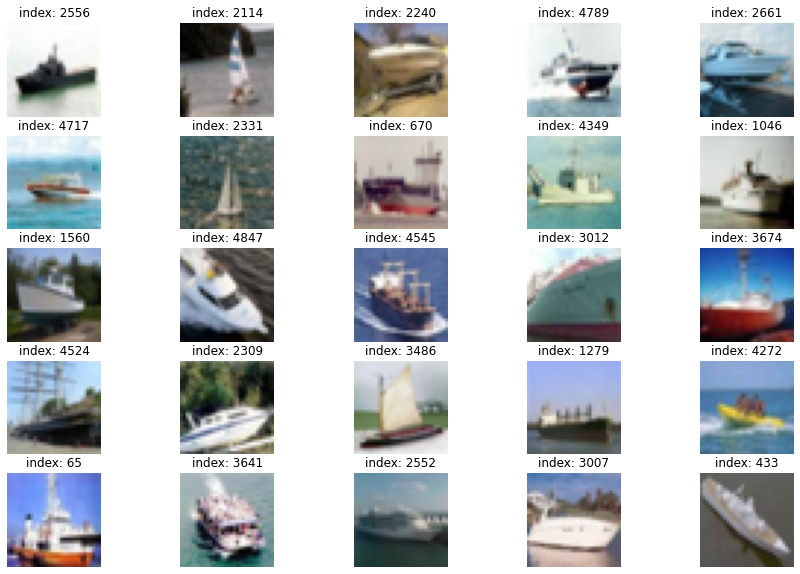

In [8]:
plt.figure(figsize=(15, 10))

for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(train_x.shape[0])                          # 임의의 한 개의 난수(정수)를 뽑음
    plt.imshow(de_normalize(train_x[random_index]).astype(np.int32).reshape(32, 32, 3))
    plt.title(f'index: {random_index}')
    plt.axis('off')

plt.show()

## 2.4 미니배치 구성

tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하면 리스트, 넘파이, 또는 텐서플로우의 텐서 자료형에서 데이터셋을 만들 수 있다.

시간 단축과 메모리 활용을 효율적으로 하기 위해 적절한 사이즈로 잘라서 학습을 진행하는 방식인 미니배치 학습 방식을 사용한다

- BUFFER_SIZE : 전체 데이터를 섞기 위해 50000 으로 설정
- BATCH_SIZE : 모델이 한 번에 학습할 데이터의 양

In [9]:
BUFFER_SIZE = 5000
BATCH_SIZE = 256

In [10]:
# tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋 구성
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# STEP 3. 생성자 모델 구현하기

- (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수를 작성해 봅시다.
- noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 방금 구현한 생성자로 랜덤 이미지를 생성해 봅시다.
- 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해 봅시다.

## 생성자 함수 정의

In [11]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))   # 256: Batchsize
    model.add(layers.BatchNormalization())                                 # Layer that normalizes its inputs.
                                                                           # Batch normalization applies a transformation that maintains the mean output close to 0 and the output standard deviation close to 1.                                                                         
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((4, 4, 256)))                                 # 이후 convolution 연산을 할 수 있도록 1차원 벡터(16,384)를 (8, 8, 256)형상의 3차원 벡터로 변환시키는 작업

    # Third: Conv2DTranspose layer        -   Conv2D와 반대로 이미지 사이즈를 넒혀주는 층
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer       -   Conv2D와 반대로 이미지 사이즈를 넒혀주는 층
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer        -   Conv2D와 반대로 이미지 사이즈를 넒혀주는 층
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

In [12]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              409600    
_________________________________________________________________
batch_normalization (BatchNo (None, 4096)              16384     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 4096)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

In [13]:
# 가우시안 랜덤 노이즈 뽑기
noise = tf.random.normal([1, 100])

In [14]:
# 생성자가 노이즈로 Fake image 생성
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

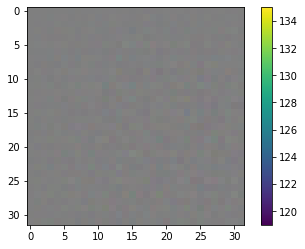

In [15]:
plt.imshow(de_normalize(generated_image[0].numpy()).astype(np.int32))
plt.colorbar()
plt.show()

# STEP 4. 판별자 모델 구현하기

- (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성해 봅시다.
- 위 STEP 3에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해 봅시다.


In [16]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.2))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.2))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))             # 판별값 1개

    return model

In [17]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [18]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00356946]], dtype=float32)>

# STEP 5. 손실함수와 최적화 함수 구현하기

- 생성자와 판별자의 손실함수(loss)를 구현해 봅시다.
- 판별자의 출력값을 가지고 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현해 봅시다.
- 생성자와 판별자를 최적화하는 optimizer를 정의합니다.

## 손실함수

GAN은 손실함수로 이진 교차 엔트로피(binary cross entropy)를 사용

교차 엔트로피를 계산하기 위해 입력할 값은 판별자가 판별한 값인데, 판별자 모델의 맨 마지막 Layer에는 값을 정규화시키는 sigmoid나 tanh 함수와 같은 활성화 함수가 없었다. 즉, 판별자가 출력하는 값은 범위가 정해지지 않아 모든 실숫값을 가질 수 있다.

### from_logits
- tf.keras.losses의 BinaryCrossEntropy 클래스는 기본적으로 본인에게 들어오는 인풋값이 0-1 사이에 분포하는 확률값이라고 가정
- 따라서 from_logits를 True로 설정해 주어야 BinaryCrossEntropy에 입력된 값을 함수 내부에서 sigmoid 함수를 사용해 0~1 사이의 값으로 정규화한 후 알맞게 계산할 수 있음

In [19]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [20]:
# real_output : 판별자가 Real Image를 입력받아 판별한 값, D(real_image)
# fake_output : 생성자가 생성한 Fake Image를 입력받아 판별한 값, D(fake_image)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss


def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

### generator_loss
- fake_output가 1에 가까워지기를 바라므로, tf.ones_like와의 교차 엔트로피값을 계산
- cross_entropy(tf.ones_like(fake_output), fake_output) 값은 fake_output이 (Real Image를 의미하는) 1에 가까울수록 작은 값을 가짐

### discriminator_loss
- real_output 값은 1에 가까워지기를, fake_output 값은 0에 가까워지기를 바라므로, 두 가지 loss값을 모두 계산
- real_output은 1로 채워진 벡터와, fake_output은 0으로 채워진 벡터와 비교
- 최종 discriminator_loss 값은 이 둘을 더한 값

### discriminator accuracy

- real accuracy와 fake accuracy는 초반에는 1.0에 가깝게 나오다가, 서서히 낮아져서 둘 다 0.5에 가까워지는 것이 이상적
- fake accuracy가 1.0에 더 가깝다면 아직은 생성자가 판별자를 충분히 잘 속이지 못하고 있다는 뜻

## 최적화 함수(Optimizer)

In [21]:
# ADAM 옵티마이저 사용
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

샘플은 한 번에 16장을 생성한다.

생성할 샘플은 매번 같은 노이즈로 생성해야 그에 대한 진전 과정을 확인할 수 있으므로, 고정된 seed 노이즈를 만들어두어야한다.
즉, 100차원의 노이즈를 총 16개, (16, 100) 형상의 벡터를 만들어둔다.

## 샘플확인 - 생성자가 생성한

In [22]:
noise_dim = 100
num_examples_to_generate = 16  # 생성자가 생성한 샘플 16개

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

# STEP 6. 훈련과정 상세 기능 구현하기

아래와 같은 과정을 통해 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현해보자.

- (1) 입력데이터: Real Image 역할을 할 images 한 배치 세트를 입력으로 받음
- (2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함
- (3) tf.GradientTape()는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 with 구문 열기
- (4) generated_images 생성 : generator가 noise를 입력받은 후 generated_images 생성
- (5) discriminator 판별 : discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력
- (6) loss 계산 : fake_output, real_output으로 generator와 discriminator 각각의 loss 계산
- (7) accuracy 계산 : fake_output, real_output으로 discriminator의 정확도 계산
- (8) gradient 계산 : gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산
- (9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신
- (10) 리턴값 : 이번 스텝에 계산된 loss와 accuracy를 리턴

In [23]:
@tf.function                                           # 데코레이터 사용. tf v1에서는 매번 session을 열고 닫았던 번거로운 일을 안하게 해줌
def train_step(images):                                # (1) 입력데이터: Real image, batchsize만큼 받아옴
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  # (2) 생성자(Generator) 입력 노이즈 : Real image의 배치사이즈 만큼 생성

    # (3) tf.GradientTape() 오픈 : 자동 미분
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        #(4) generator 이미지 생성
        generated_images = generator(noise, training=True)         #    훈련 시기이므로 True
        
        #(5) discriminator 판별
        real_output = discriminator(images, training=True)         #    훈련 시기이므로 True
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    # (8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # (9) 모델 학습 - 가중치 갱신
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현

In [24]:
# 예측 이미지를 파일에 저장
# gif 파일 생성을 위함
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(de_normalize(predictions[i, :, :, :].numpy()).astype(np.int32))
        plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

생성자와 판별자의 Loss와 Accuracy 히스토리를 그래프로 시각화

In [25]:
# training_history 생성
from matplotlib.pylab import rcParams      # runtime configuration
rcParams['figure.figsize'] = 15, 6         # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    
    # summarize history for "Loss"  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    
    # summarize history for "Accuracy"
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 "그래프를 이미지 파일"로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

마지막으로, training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정한다.

tf.train.Checkpoint를 활용하면 매번 모델을 직접 저장해주지 않아도, 코드 한 줄로 빠르고 편하게 버전 관리를 할 수 있다.  

모델이 복잡해지고 학습 속도가 오래 걸릴수록, **모델에 대한 저장 및 버전 관리는 필수**적이다.

In [26]:
# 체크 포인트 만들기
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# 체크포인트 객체
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# STEP 7. 모델 학습

- 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.
- 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.
- 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.

(참고)
 학습 과정 중 학습 epoch를 추가 진행해야 하거나, 학습한 모델을 활용하여 이미지를 생성할 필요가 생깁니다. 그럴 때마다 모델 학습을 처음부터 다시 진행한다면 시간 낭비가 될 것입니다.
우리는 위에서 checkpoint 모듈을 이용해 모델을 저장해 둔 바 있습니다. 이를 이용해 학습해 둔 모델을 로드하면 모델 재학습이 필요 없이 이런 작업을 진행할 수 있습니다.
아래는 checkpoint 모듈을 활용하여 모델을 로드하는 예시입니다.

checkpoint를 통해 모델이 로드되었으면 아래 코드를 실행할 경우 로드된 모델의 파라미터 상태에서 훈련을 재개할 수도 있습니다.
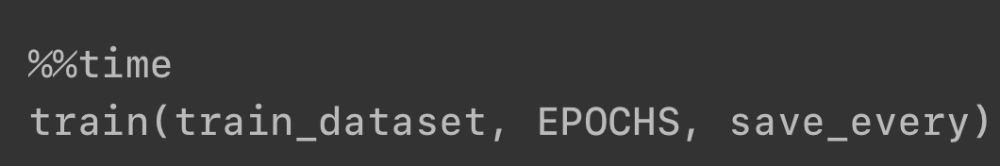

## 학습 함수 정의

In [27]:
def train(dataset, epochs, save_every):
    start = time.time()                                 #  1970년 1월 1일 0시 0분 0초 이후 경과한 시간을 초단위로 반환
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()                                           
        for it, image_batch in enumerate(dataset):            # it은 196개. 왜냐하면 batchsize가 256개, 데이터셋이 50000개, 나머지 하나는 batchsize 80개
                                                              # STEP 2.4 미니배치 확인 
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)  # train_step함수 호출
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)                             # clear_output()은 셀의 출력 결과를 지우는 기능
                generate_and_save_images(generator, epoch+1, it+1, seed)    # 샘플 이미지를 생성하고 저장
                                                                            # epoch, it에 +1 하는 이유는 for문에서 처음이 0부터 시작하므로
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)        # 모델 저장

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))       # 시작시간과 현재까지의 시간의 차이 

        # 학습 과정 시각화
        draw_train_history(history, epoch)         # draw_train_history함수 호출     

In [28]:
# 확인용
train_dataset      # BatchDataset 객체

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float64>

In [29]:
# 확인용
for it, image_batch in enumerate(train_dataset):
#     print(it)                 
    print(image_batch.shape)    # 배치사이즈 256개
#     if it == 0: 
#         print(image_batch[0])

(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(256, 32, 32, 3)
(136, 32, 32, 3)


## Epoch 정의

In [39]:
save_every = 5
EPOCHS = 500

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## 학습

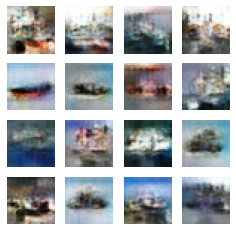

Time for training : 1565 sec


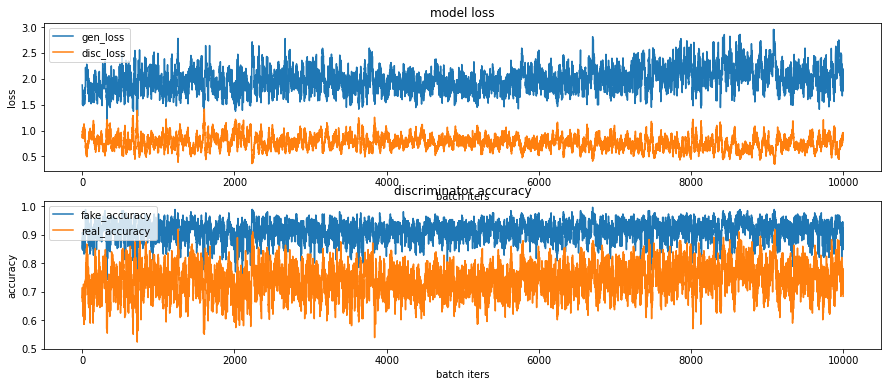

CPU times: user 28min 15s, sys: 4min 21s, total: 32min 36s
Wall time: 26min 6s


In [40]:
%%time                                            
                                                  # %%time prints the wall time for the entire cell
                                                  # %%time is a magic command. It's a part of IPython.
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/cifar10/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인해 보시길 권합니다.

## 학습과정 시각화하기

In [32]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_mnist_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar/cifar_mnist_dcgan.gif

ls: cannot access '/aiffel/aiffel/dcgan_newimage/cifar/cifar_mnist_dcgan.gif': No such file or directory


## 체크포인트 저장

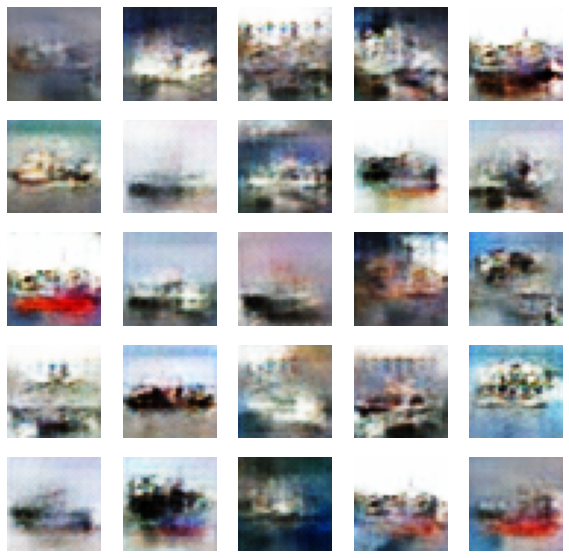

In [41]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)

    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
    
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

# STEP 8. (optional) GAN 훈련 과정 개선하기

- STEP 6을 진행하면서 생성된 샘플 이미지, 학습 과정 그래프 등을 통해 이전 훈련 과정의 문제점을 분석해 봅시다.
- 모델구조 또는 학습 과정을 개선한 내역과 그 결과(샘플 이미지, 학습 과정 그래프 포함)를 함께 제출합니다.

(참고) 아래 언급된 페이지들에서 개선을 위한 아이디어를 얻을 수 있을 것입니다

- [How to Train a GAN? Tips and tricks to make GANs work](https://github.com/soumith/ganhacks)
- [10 Lessons I Learned Training GANs for one Year](https://towardsdatascience.com/10-lessons-i-learned-training-generative-adversarial-networks-gans-for-a-year-c9071159628)
- [Tips for Training Stable Generative Adversarial Networks](https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/)
- [Improved Techniques for Training GANs(paper)](https://proceedings.neurips.cc/paper/2016/file/8a3363abe792db2d8761d6403605aeb7-Paper.pdf)

## 첫번째 시도 : Epoch = 200

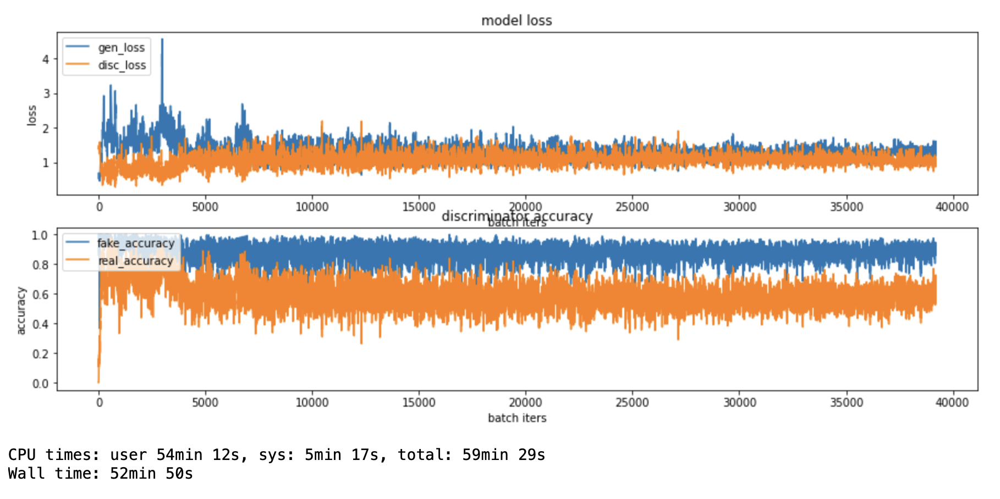
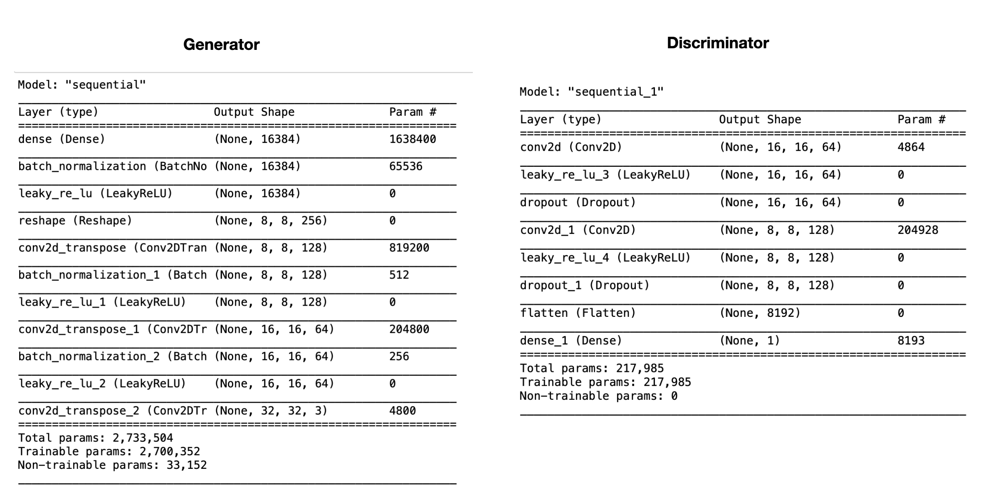


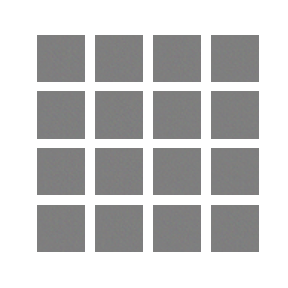

In [44]:
display.Image('/aiffel/aiffel/dcgan_newimage/cifar10/cifar10_mnist_dcgan_200_epoch.gif')

# Epoch 1000 + 200 + 300 + 500


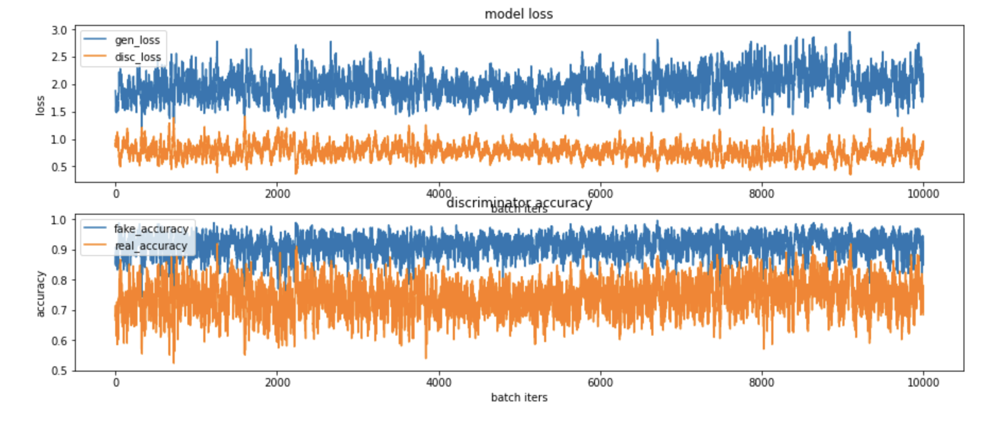


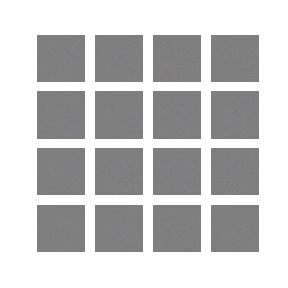

In [43]:
display.Image('/aiffel/aiffel/dcgan_newimage/cifar10/cifar10_mnist_dcgan.gif')

# STEP 9. 회고

1. 이번 프로젝트에서 어려웠던 점 
    - GAN의 핵심 내용은 뭔지 알겠는데 코드로 구현하고 읽고 해석하는데 어려웠다
    - 아이펠 커널이 매번 죽어서 결과도 도출못하고 날렸습니다. 체크포인트로 재실행 요청해도 *표시로 진행되지 않는 문제도 있어서 여러 번 처음부터 다시실행했습니다
    - 아이펠 커널이 죽는 것을 대비하여 Epoch 2000을 1000, 200, 300, 500으로 나눠서 각각 시도하면서 2000번 돌렸다. 그 결과 gif에서 그림이 뒤썩여 있다
    
2. 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점
    - 체크포인트로 구간을 기록하고 이어서 진행할 수 있다는 점을 알았다
    - tf.GradientTape의 사용법이 정확히 뭔지 모르겠다


3. 루브릭 평가 지표를 맞추기 위해 시도한 것들
    - Fake Accuracy가 추세적으로 0.5로 하향하도록 epoch과 학습률을 조정하면서 시도해봤다
    - 생성자가 제대로 사진을 표현하는지 epoch, dropout, layer, batch_size 등 변경해보면서 시도했다
    
4. 만약에 루브릭 평가 관련 지표를 달성 하지 못했을 때, 이유에 관한 추정  
    - fake accuracy를 0.5로 하향하는 추세를 달성하지 못했다. 모델을 개선하는 방법을 추가적으로 도입해야 될 것 같다

    
5. 자기 다짐
    - GAN이 무엇인지 알았으나 코드를 읽고 해석하는데 어려움이 있었다. 여러 자료들을 찾아보면서 이해도를 높여야겠다

    
